# Image Processing with OpenCV

In this notebook, I have further explored OpenCV and some of the useful functions provided for image processing purposes. Some of the techniques covered in this notebook:
1. Blending Images (cv2.addWeighted)
2. Thresholding (cv2.threshold)
3. Blurring, including Gamma corrections, and 4 common blur methods
4. Morphological Operators: Erode, "Opening", "Closing", the prior two used to reduce noise in an image
5. Gradients and sobel operators
6. Image Histograms
7. Histogram Equalization for improving contrast

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

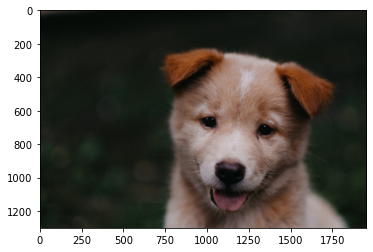

In [2]:
img1 = cv2.imread('./DATA/00-puppy.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)   # Remember the cv2 <--> plt color conversions
plt.imshow(img1)

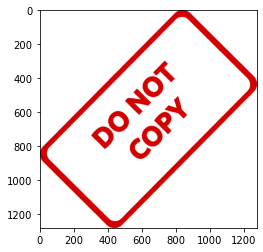

In [3]:
img2 = cv2.imread('./DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.imshow(img2)

In [4]:
print(img1.shape)
print(img2.shape)

(1300, 1950, 3)
(1280, 1277, 3)


In [5]:
# Have to resize images to the same size, before Blending them
img2 = cv2.resize(img2, (1950, 1300))

## Alpha - Beta - Gamma Image Blending

Use the addWeighted cv2 function to blend 2 images

In [6]:
blended = cv2.addWeighted(src1 = img1, alpha = 0.5, src2 = img2, beta = 0.8, gamma = 0)

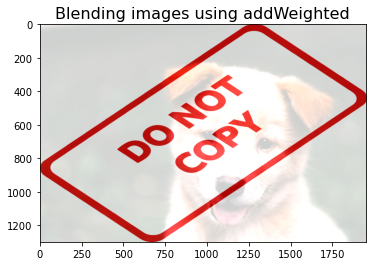

In [7]:
plt.title("Blending images using addWeighted", fontsize = 16)
plt.imshow(blended)

## Thresholding:

Thresholding converts an image (consisting of a variety of colors or shades) into just 2 colors: white and black only, i.e, it converts a color-image to a Binary image. An example is shown below

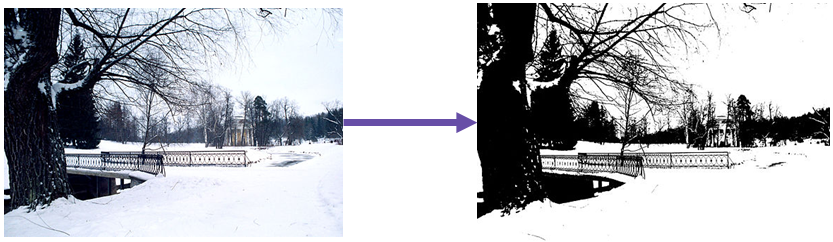

In [8]:
rainbow = cv2.imread('./DATA/rainbow.jpg')
# Import directly as grayscale:  rainbow = cv2.imread('./DATA/rainbow.jpg', 0)
rainbow_gray = cv2.cvtColor(rainbow, cv2.COLOR_BGR2GRAY)

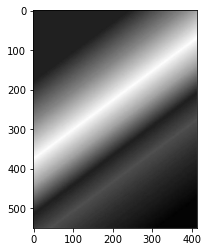

In [9]:
plt.imshow(rainbow_gray, cmap = 'gray')

#### cv2.threshold returns a Tuple: the thresh (number), and the new image.

In [10]:
thresh, new_img = cv2.threshold(rainbow_gray, 127, 255, cv2.THRESH_TOZERO)

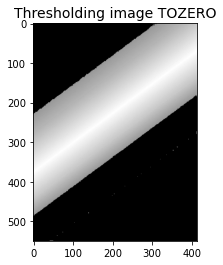

In [11]:
plt.title("Thresholding image TOZERO", fontsize = 14)
plt.imshow(new_img, cmap = 'gray')

## A function to show image larger in Plt

In [12]:
def show_picture_large(img):
    fig = plt.figure(figsize = (10, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

def show_picture_large_grayscale(img):
    fig = plt.figure(figsize = (10, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap = 'gray')

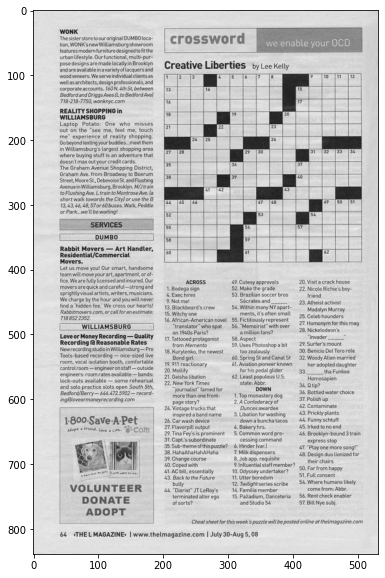

In [13]:
crossword = cv2.imread('./DATA/crossword.jpg', 0)
show_picture_large_grayscale(crossword)

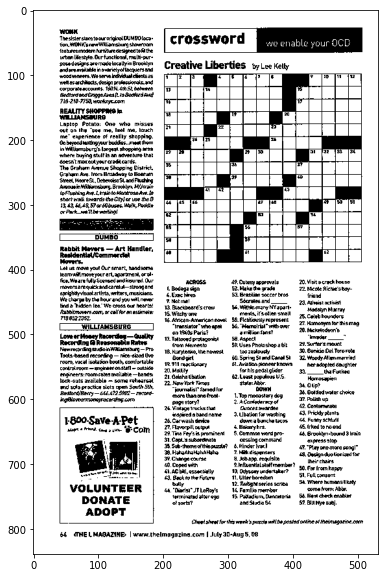

In [14]:
thresh, bin_image = cv2.threshold(crossword, 180, 255, cv2.THRESH_BINARY)
show_picture_large_grayscale(bin_image)

#### Adaptive Threshold:

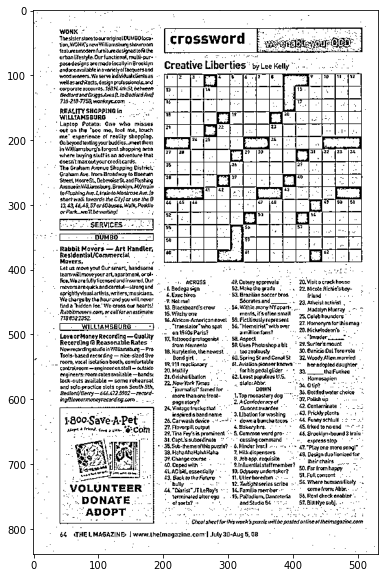

In [15]:
th2 = cv2.adaptiveThreshold(crossword, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 8)
                                                                                        # 11 = Neighbours
show_picture_large_grayscale(th2)

## Blurring

A good application of blurring is for edge detection, since a non-blurred image would usually show too many (and unnecessary) edges, whereas a blurred image would perform better for edge detection

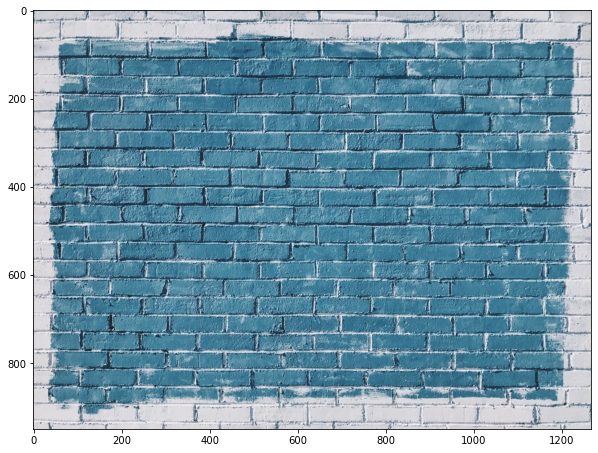

In [16]:
bricks = cv2.imread('./DATA/bricks.jpg').astype(np.float32) / 255
bricks = cv2.cvtColor(bricks, cv2.COLOR_BGR2RGB)
show_picture_large(bricks)

### Gamma Corrections (Change "brightness"): Gamma < 1 makes it lighter, > 1 makes it darker

image = np.POWER( to the power gamma )

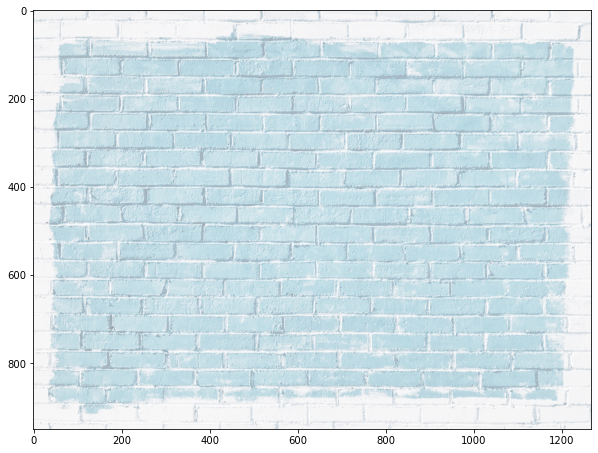

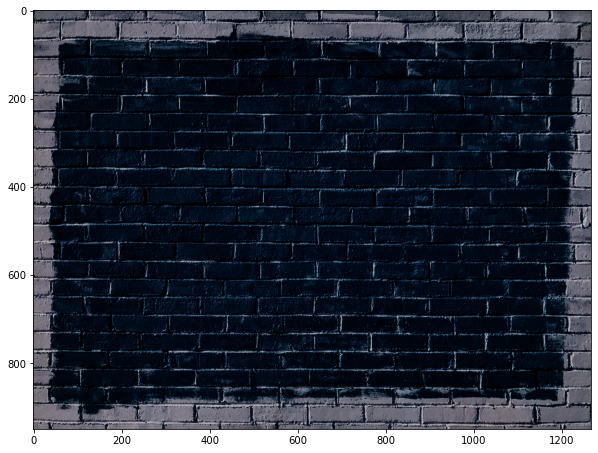

In [18]:
# Make it lighter
gamma = 1/5
lighterBricks = np.power(bricks, gamma)
show_picture_large(lighterBricks)

# Make it darker
gamma = 5
darkerBricks = np.power(bricks, gamma)
show_picture_large(darkerBricks)

### 1. Blurring with our own filter

In [19]:
kernel = np.ones((5, 5), np.float32) / 25
print(kernel)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


Create a kernel, for example the one above, then use filter2D method with this kernel 

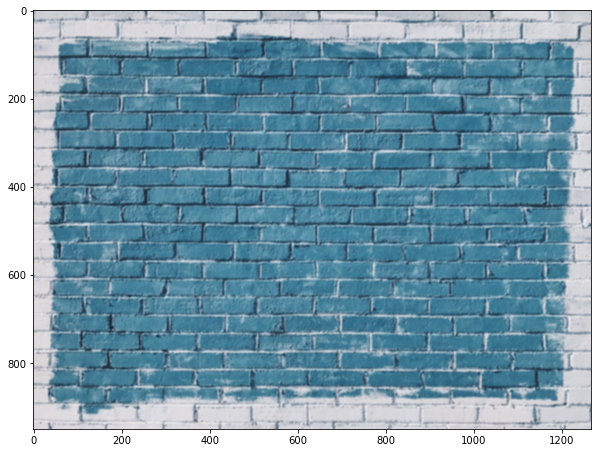

In [20]:
dst = cv2.filter2D(bricks, -1, kernel)
show_picture_large(dst)

### 2. cv2.blur()

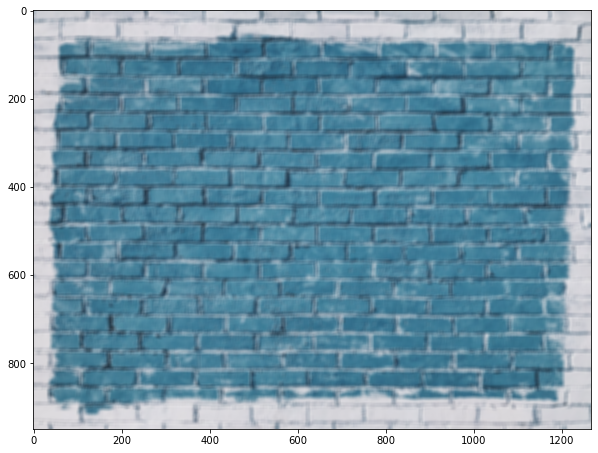

In [21]:
dst = cv2.blur(bricks, ksize = (10, 10))
show_picture_large(dst)
# Pretty good blur here.

### 3. Gaussian Blur

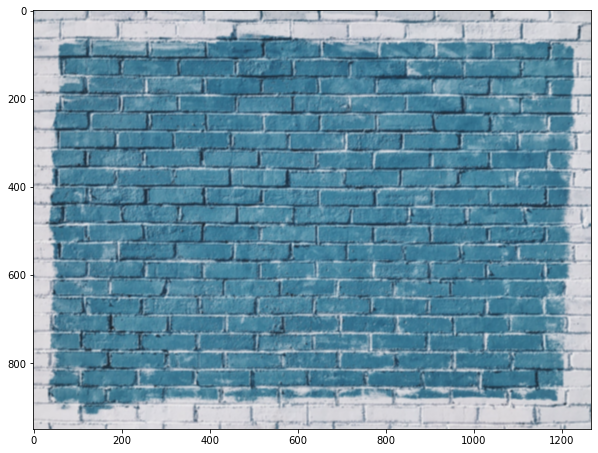

In [22]:
dst = cv2.GaussianBlur(bricks, (5, 5), 10)
show_picture_large(dst)

### 4. Median Blur

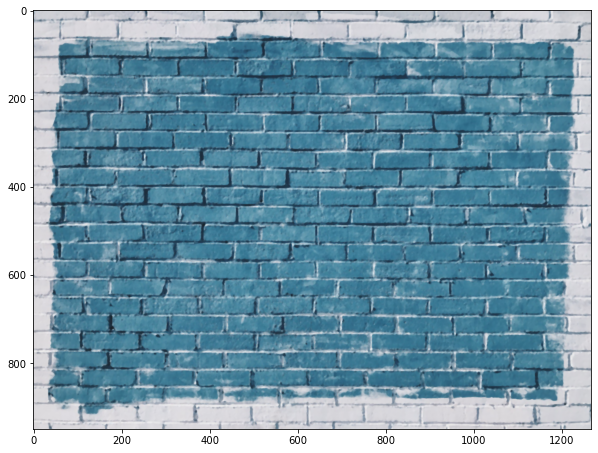

In [23]:
median_blur = cv2.medianBlur(bricks, 5)
show_picture_large(median_blur)

#### Median blur can be useful to remove "noise" from an image. But, median blue may remove some details. To remove noise and keep some important features, we can use bilateralFilter()

# Morphological Operators

### 1. Erode()

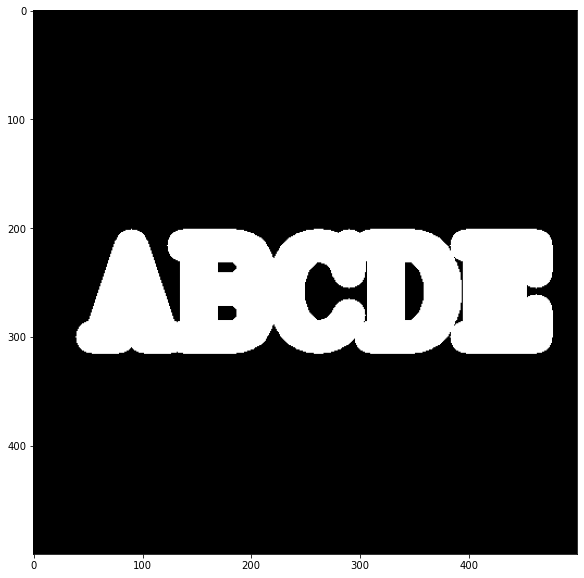

In [24]:
img = np.zeros((500, 500))
cv2.putText(img, "ABCDE", org = (50, 300), fontFace = cv2.FONT_HERSHEY_COMPLEX, fontScale = 4, color = (255, 255, 0), thickness = 30)
show_picture_large_grayscale(img)

In [25]:
# Create a simple kernel
kernel = np.ones((5, 5), dtype = np.uint8)
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


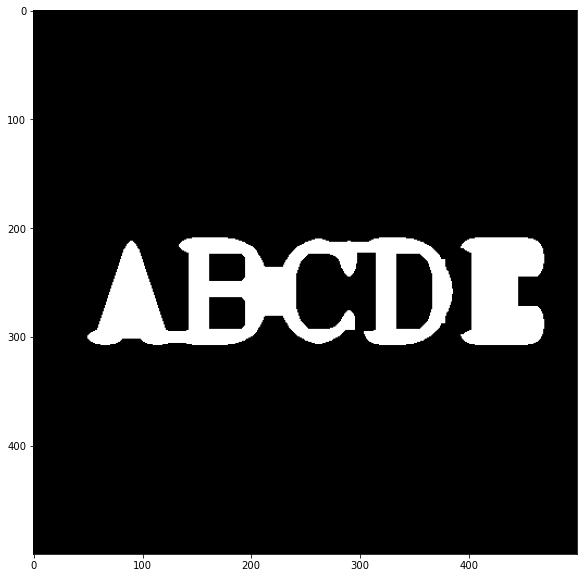

In [26]:
img = cv2.erode(img, kernel, iterations = 4)
show_picture_large_grayscale(img)

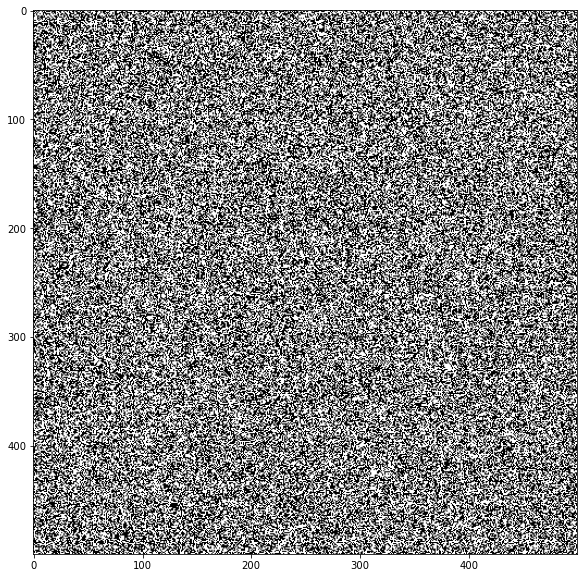

In [27]:
white_noise = np.random.randint(low = 0, high = 2, size = (500, 500)) * 255
show_picture_large_grayscale(white_noise)

In [28]:
# Combining the 2 images to Add Noise
noise_img = img + white_noise

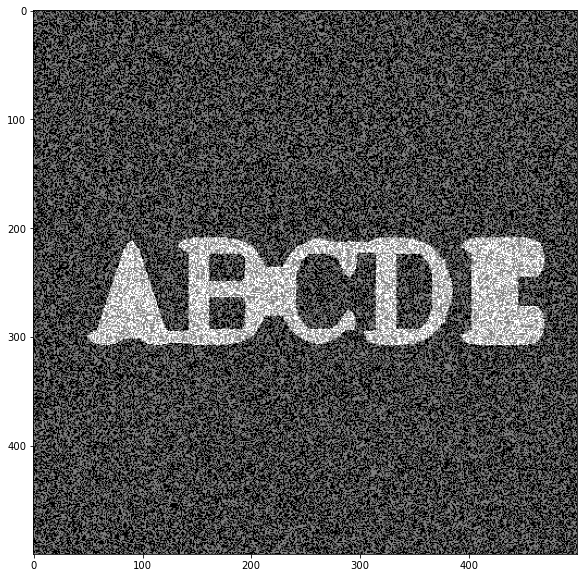

In [29]:
show_picture_large_grayscale(noise_img)

### "OPENING": To remove the noise

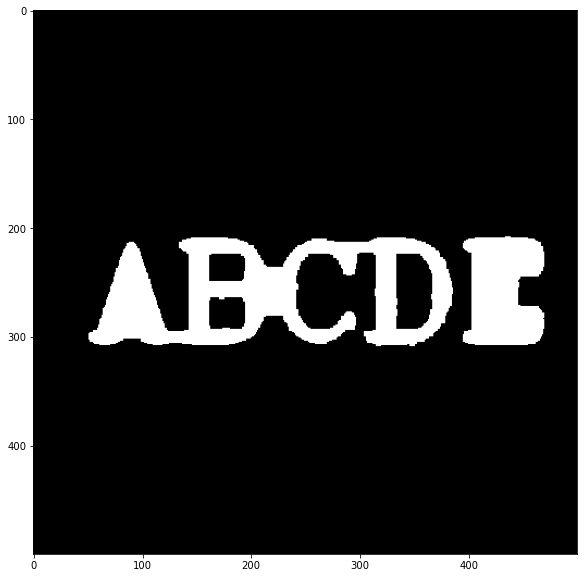

In [30]:
# Opening = Erosion + Dilation
opening = cv2.morphologyEx(noise_img, cv2.MORPH_OPEN, kernel)
show_picture_large_grayscale(opening)

Almost all the noise is removed from the above image

### "CLOSING", also to remove noise

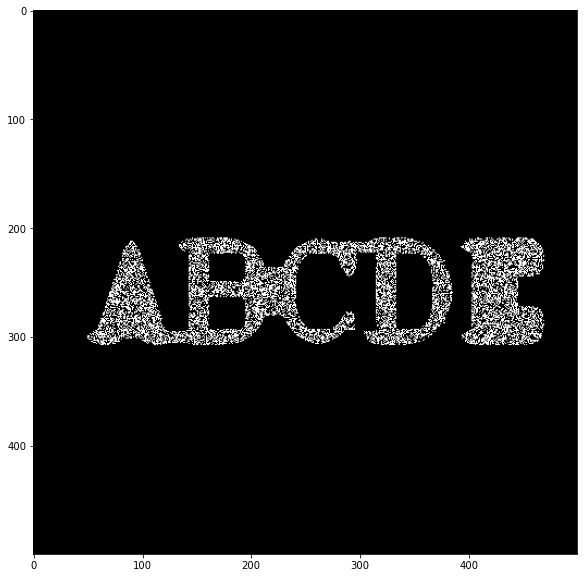

In [31]:
# Creating a black noised image
black_noise = np.random.randint(low = 0, high = 2, size = (500, 500)) * -255

black_noise_img = black_noise + img
black_noise_img[black_noise_img == -255] = 0
show_picture_large_grayscale(black_noise_img)

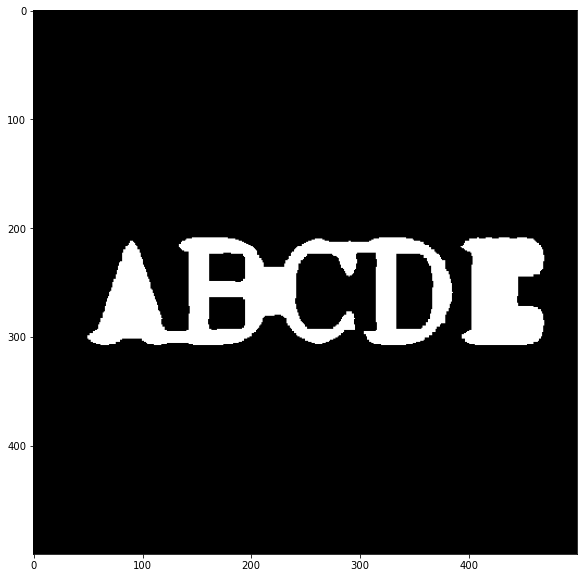

In [32]:
closing = cv2.morphologyEx(black_noise_img, cv2.MORPH_CLOSE, kernel)
show_picture_large_grayscale(closing)

## Gradient: Crude form of edge detection

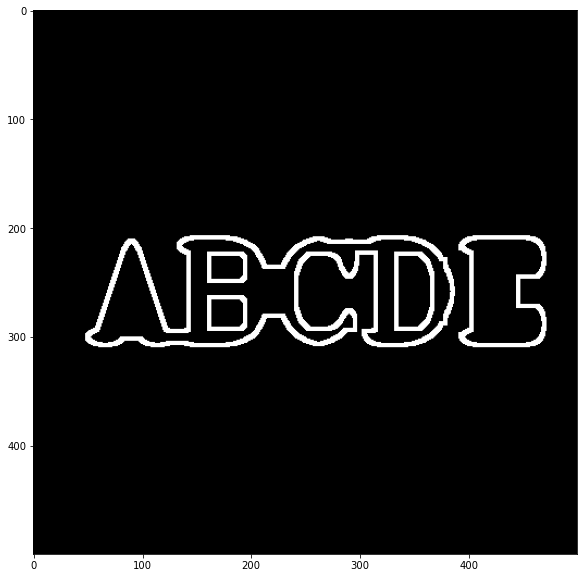

In [33]:
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
show_picture_large_grayscale(gradient)

# Gradients and Sobel Operators

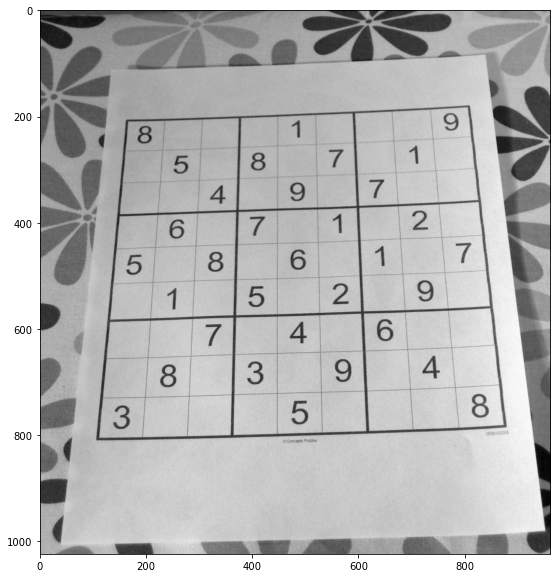

In [34]:
sudoku = cv2.imread('./DATA/sudoku.jpg', 0)
show_picture_large_grayscale(sudoku)

### Sobel x and y gradients:

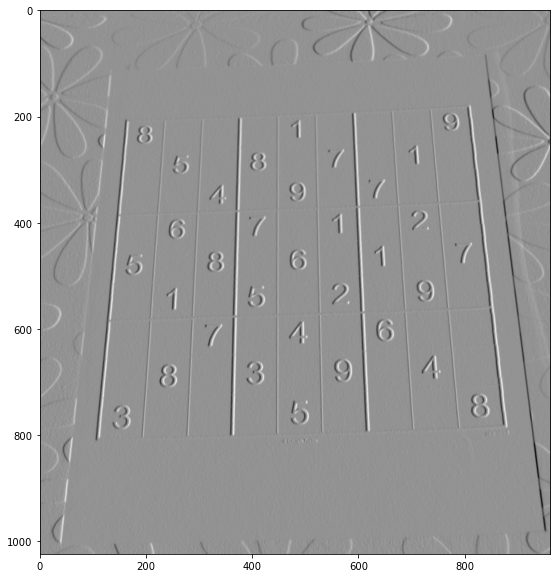

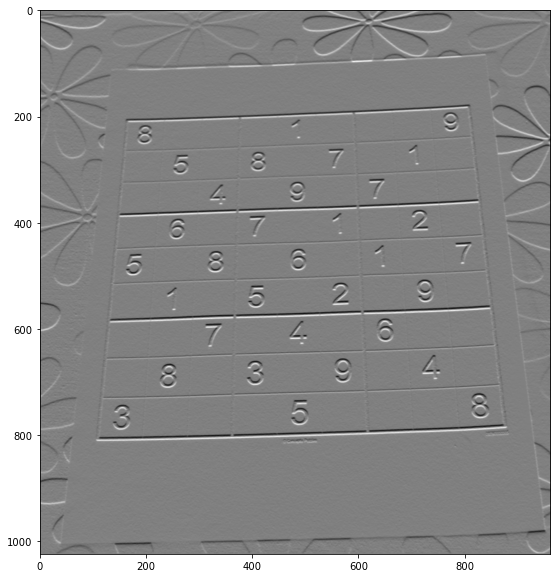

In [35]:
sobelx_gradient = cv2.Sobel(sudoku, cv2.CV_64F, 1, 0, ksize = 5)
show_picture_large_grayscale(sobelx_gradient)

sobely_gradient = cv2.Sobel(sudoku, cv2.CV_64F, 0, 1, ksize = 5)
show_picture_large_grayscale(sobely_gradient)

# Notice how the sobelx gradient shows Vertical Edges while the sobely shows Horizontal Edges

### Add Weighted (Blend) x and y sobel gradient images:

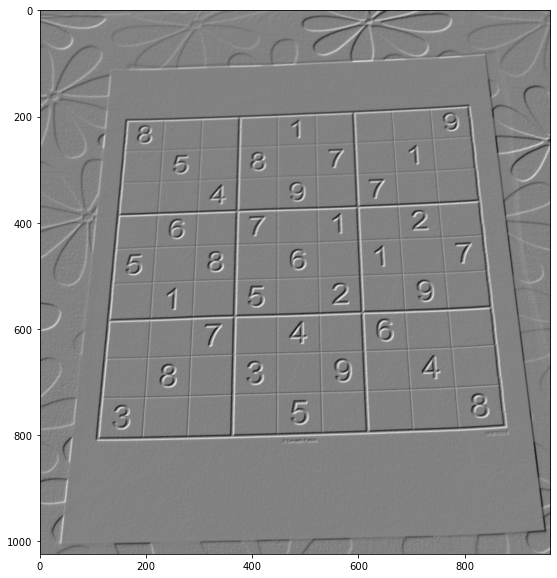

In [36]:
sobel_x_and_y = cv2.addWeighted(sobelx_gradient, 1, sobely_gradient, 1, 0.5)
show_picture_large_grayscale(sobel_x_and_y)

### Thresholding this now,

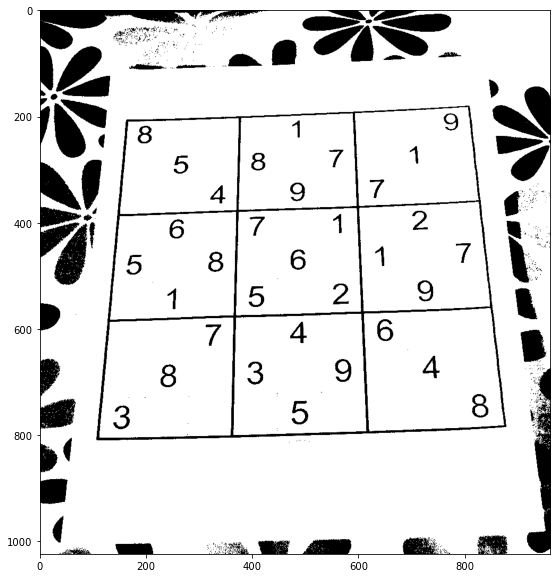

In [37]:
returnVal, thresh_img = cv2.threshold(sudoku, 120, 255, cv2.THRESH_BINARY)
show_picture_large_grayscale(thresh_img)

### Laplacian Gradient

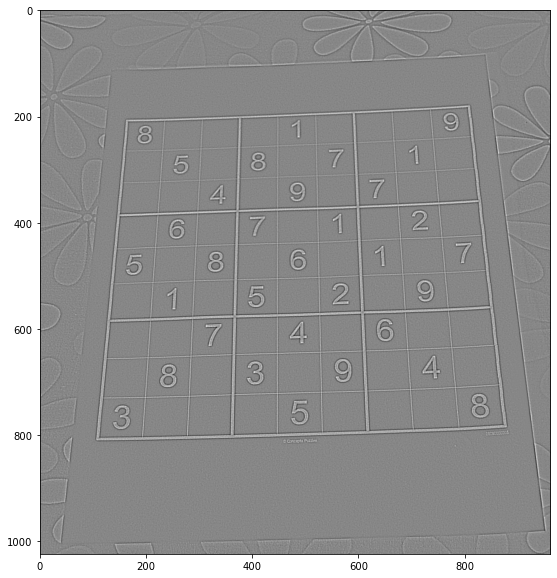

In [38]:
laplacian = cv2.Laplacian(sudoku, cv2.CV_64F, ksize = 5)
show_picture_large_grayscale(laplacian)

### Morph_Gradient with our own Ones kernel

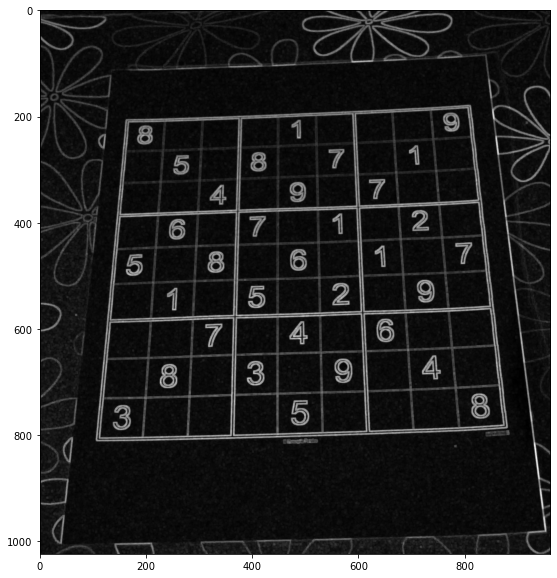

In [39]:
kernel = np.ones((4, 4), np.uint8)
gradient = cv2.morphologyEx(sudoku, cv2.MORPH_GRADIENT, kernel)
show_picture_large_grayscale(gradient)

# Image Histograms

In [40]:
dark_horse = cv2.imread('./DATA/horse.jpg')
rainbow = cv2.imread('./DATA/rainbow.jpg')
blue_bricks = cv2.imread('./DATA/bricks.jpg')

dark_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)
rainbow = cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)
blue_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

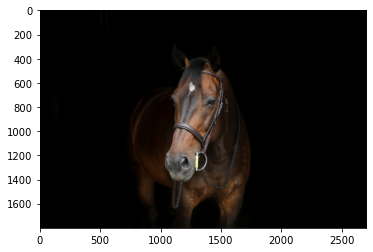

In [41]:
plt.imshow(dark_horse)

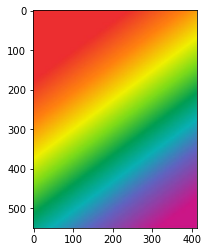

In [42]:
plt.imshow(rainbow)

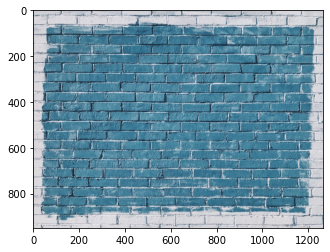

In [43]:
plt.imshow(blue_bricks)

Note: For showing purposes, we have transformed the image into Plt configuration: RGB. So, now remember that blue is channel[2], green is [1] and red is [0]

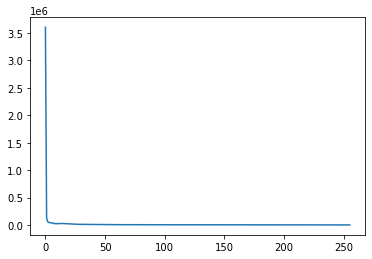

In [46]:
# NOTE that even a single image must be passed as an array
hist_values = cv2.calcHist([dark_horse], channels = [2], mask = None, histSize = [256], ranges = [0, 256])
plt.plot(hist_values)

In [47]:
def show_histogram(img):
    colors = ['red', 'green', 'blue']

    for i in range(3):
        hist_values = cv2.calcHist([img], channels = [i], mask = None, histSize = [256], ranges = [0, 256])
        plt.plot(hist_values, color = colors[i])
        # plt.xlim([0, 20])
        # plt.ylim([0, 200000])
        
    plt.show()

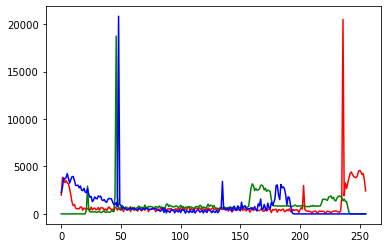

In [48]:
show_histogram(rainbow)

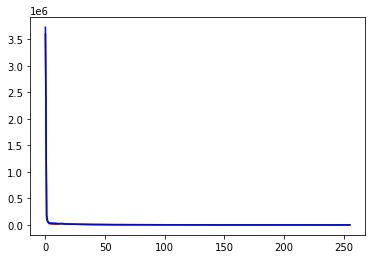

In [49]:
show_histogram(dark_horse)

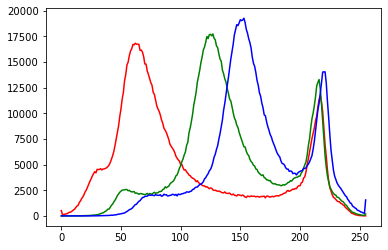

In [50]:
show_histogram(blue_bricks)

### Masking

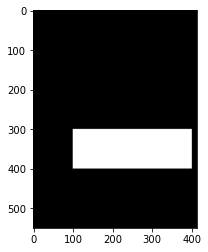

In [51]:
mask = np.zeros((rainbow.shape[0], rainbow.shape[1]), dtype = np.uint8)
mask[300:400, 100:400] = 255
plt.imshow(mask, cmap = 'gray')

# Create a mask of the size of the original image, (But only 2D)
# Wherever you want to mask, make that portion slice = WHITE (255)

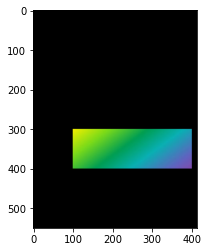

In [52]:
# Now, Bitwise AND both the images:
# THIS IS ONLY FOR SHOWING PURPOSES. The mask itself will be fed as a parameter to the hist function
masked_rainbow = cv2.bitwise_and(rainbow, rainbow, mask = mask)
plt.imshow(masked_rainbow)

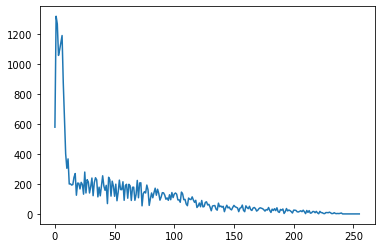

In [53]:
# We can pass a "mask" param in calcHist, instead of creating a new image out of a segement.
hist_red = cv2.calcHist([masked_rainbow], channels = [0], mask = mask, histSize = [256], ranges = [0, 256])
plt.plot(hist_red)

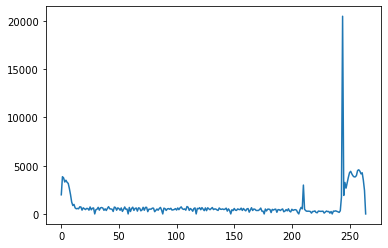

In [54]:
# Histogram without the mask, for comparison: 
# [0] because we have already converted to RGB. 0 = RED
hist_red_without_mask = cv2.calcHist([rainbow], [0], None, [265], [0, 256])
plt.plot(hist_red_without_mask)

## Histogram Equalization
Used to increase contrast. Notice the clear change in the image histograms plotted below

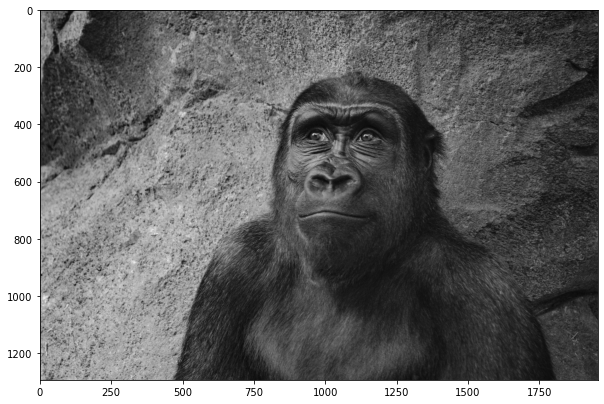

In [55]:
gorilla = cv2.imread('./DATA/gorilla.jpg', 0)
show_picture_large_grayscale(gorilla)

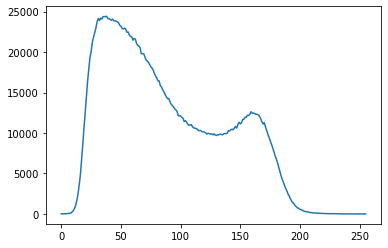

In [56]:
# First arg is "imageS", its a LIST of images.
hist_values = cv2.calcHist([gorilla], [0], None, [256], [0, 256])
plt.plot(hist_values)

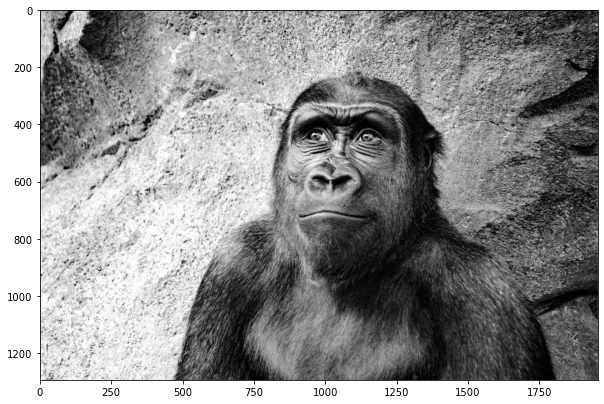

In [57]:
eq_hist = cv2.equalizeHist(gorilla)
show_picture_large_grayscale(eq_hist)

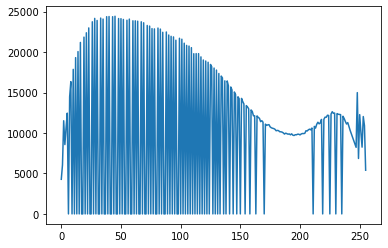

In [58]:
eq_hist_values = cv2.calcHist([eq_hist], [0], None, [256], [0, 256])
plt.plot(eq_hist_values)

### For color Images:

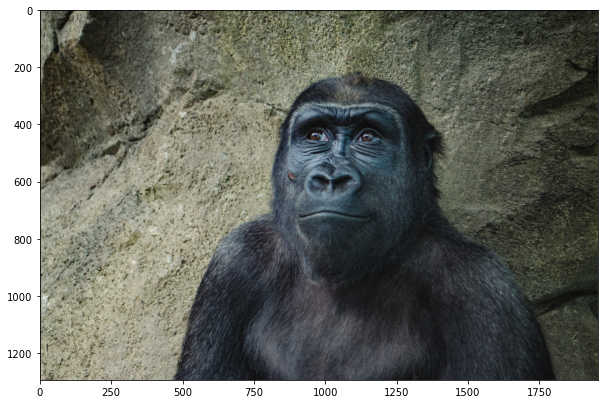

In [59]:
gorilla = cv2.imread('DATA/gorilla.jpg')
gorilla = cv2.cvtColor(gorilla, cv2.COLOR_BGR2RGB)
show_picture_large(gorilla)

In [60]:
# We need HSV version to do Histogram equalization for Color Images
hsv_gorilla = cv2.cvtColor(gorilla, cv2.COLOR_RGB2HSV)

hsv_gorilla[:, :, 2] # This is the value channel. This is the one that needs to be equalized.

array([[127, 121, 115, ...,  43,  42,  42],
       [121, 124, 123, ...,  47,  49,  51],
       [118, 129, 131, ...,  47,  50,  53],
       ...,
       [196, 197, 184, ...,  55,  55,  55],
       [184, 185, 182, ...,  51,  52,  53],
       [173, 170, 173, ...,  49,  50,  50]], dtype=uint8)

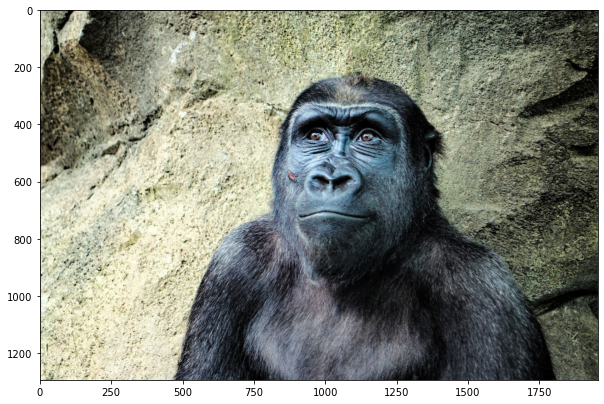

In [61]:
hsv_gorilla[:, :, 2] = cv2.equalizeHist(hsv_gorilla[:, :, 2])
hsv_gorilla = cv2.cvtColor(hsv_gorilla, cv2.COLOR_HSV2RGB)
show_picture_large(hsv_gorilla)